# Sub-ice shelf bathymetry

Floating ice shelves present a challenge to measuring the shape of the seafloor beneath them. Conventional techniques of measuring bathymetry / bed topography, such as shipboard multibeam offshore, or airborne radar onshore, in not possible due to the consistent ice coverage. Inversion of airborne gravity data provides a technique to model the bathymetry in these regions. Here we will demonstrate the gravity reduction and inversion steps unique to a sub-ice shelf bathymetry inversion. We will apply this to the Amery Ice Shelf.

## Import packages

In [ ]:
%load_ext autoreload
%autoreload 2

import os
import pathlib
import pickle
import string

import numpy as np
import scipy as sp
import verde as vd
import xarray as xr
import pandas as pd
from polartoolkit import maps, profiles, fetch, regions
from polartoolkit import utils as polar_utils

import invert4geom

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

/home/mdtanker/miniforge3/envs/invert4geom/lib/python3.12/site-packages/UQpy/__init__.py:6: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



## Get gravity data
Here we will load the AntGG-2021 grid of gravity disturbances, an Antarcitc-wide gravity compilation consisting of ground, airborne, and satellite gravity observations. 

In [2]:
region = regions.amery_ice_shelf
spacing = 10e3

In [3]:
grav_data = fetch.gravity(
    version="antgg-2021",
    anomaly_type="DG",
    region=region,
    spacing=spacing,
)

# rename coordinates to easting and northing
grav_data = grav_data.rename({"x":"easting", "y":"northing"})

# rename elevation variable to upward
grav_data = grav_data.rename({"ellipsoidal_height":"upward"})

# initialize as invert4geom data object
grav_data = invert4geom.create_data(grav_data)
grav_data

<xarray.Dataset> Size: 45kB
Dimensions:              (northing: 58, easting: 94)
Coordinates:
  * northing             (northing) float64 464B 4.3e+05 4.4e+05 ... 1e+06
  * easting              (easting) float64 752B 1.53e+06 1.54e+06 ... 2.46e+06
Data variables:
    gravity_disturbance  (northing, easting) float32 22kB 16.15 15.82 ... -16.24
    upward               (northing, easting) float32 22kB 2.428e+03 ... 24.28
Attributes:
    region:        (1530000.0, 2460000.0, 430000.0, 1000000.0)
    spacing:       10000.0
    buffer_width:  60000.0
    inner_region:  (1590000.0, 2400000.0, 490000.0, 940000.0)
    dataset_type:  data
    model_type:    prisms

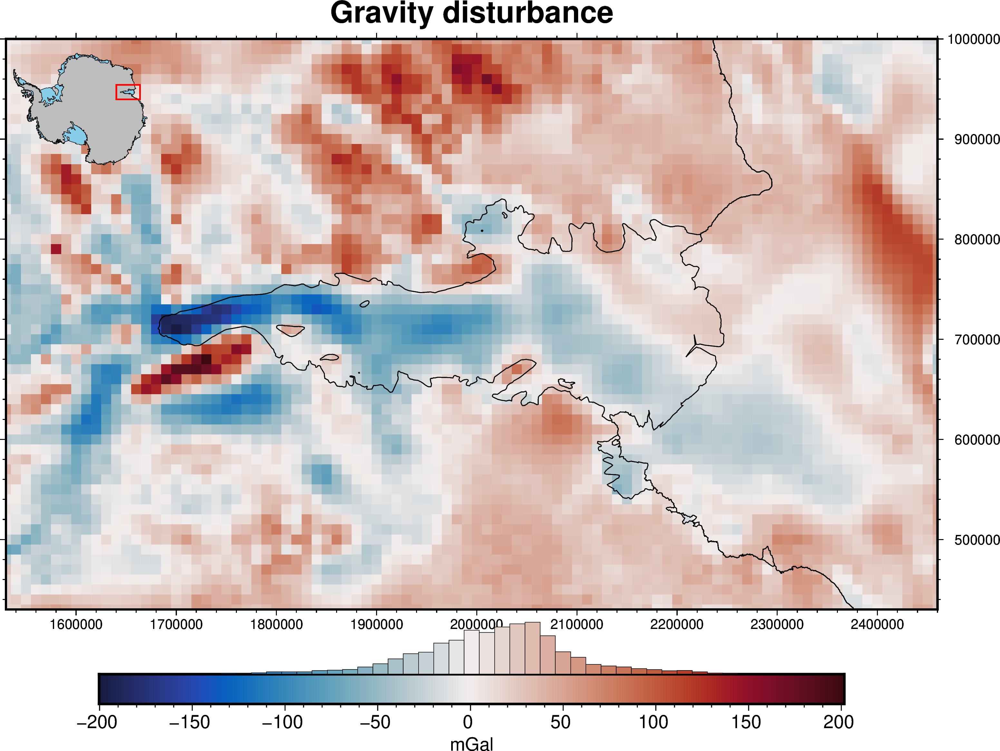

In [4]:
fig = maps.plot_grd(
    grav_data.gravity_disturbance,
    title="Gravity disturbance",
    cmap="balance+h0",
    cbar_label="mGal",
    hist=True,
    frame=["nSwE", "xaf20000", "yaf20000"],
    coast=True,
    inset=True,
)

fig.show()

## Get constraint points
These are the locations where we known bathymetry or bed topography.

In [103]:
bedmap_points = fetch.bedmap_points(version="all", region=region)

In [104]:
# rename bed elevation column
bedmap_points = bedmap_points.rename(columns={"bedrock_altitude (m)":"upward"})
bedmap_points = bedmap_points[bedmap_points.upward.notna()]
bedmap_points

,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),upward,two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),easting,northing,project,geometry,bedmap_version
852,701899,NaN,72.687000,-74.616620,NaN,NaN,1920.0,1350.00,570.0000,NaN,NaN,NaN,1.604982e+06,500295.833360,NaN,POINT (1604982.299 500295.833),bedmap1
853,701900,NaN,72.704930,-74.599290,NaN,NaN,1917.0,1278.00,640.0000,NaN,NaN,NaN,1.606968e+06,500363.150336,NaN,POINT (1606968.113 500363.15),bedmap1
854,701901,NaN,72.727330,-74.577640,NaN,NaN,1914.0,1275.00,640.0000,NaN,NaN,NaN,1.609449e+06,500445.589793,NaN,POINT (1609449.334 500445.59),bedmap1
855,701902,NaN,72.749740,-74.555990,NaN,NaN,1912.0,1187.00,724.0000,NaN,NaN,NaN,1.611931e+06,500525.919112,NaN,POINT (1611931.063 500525.919),bedmap1
856,701903,NaN,72.861780,-74.447730,NaN,NaN,1898.0,1364.00,534.0000,NaN,NaN,NaN,1.624347e+06,500900.719230,NaN,POINT (1624346.983 500900.719),bedmap1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2374111,None,NaN,77.603098,-70.129192,None,None,NaN,1424.67,93.3370,NaN,NaN,NaN,2.129211e+06,468016.654143,PRIC_2017_CHA3_AIR_BM3,POINT (2129210.752 468016.654),bedmap3
2374112,None,NaN,77.602790,-70.129031,None,None,NaN,1422.98,92.0291,NaN,NaN,NaN,2.129226e+06,468031.966162,PRIC_2017_CHA3_AIR_BM3,POINT (2129225.824 468031.966),bedmap3
2374113,None,NaN,77.602483,-70.128870,None,None,NaN,1424.67,93.3411,NaN,NaN,NaN,2.129241e+06,468047.241197,PRIC_2017_CHA3_AIR_BM3,POINT (2129240.905 468047.241),bedmap3
2374114,None,NaN,77.602176,-70.128709,None,None,NaN,1421.29,93.7356,NaN,NaN,NaN,2.129256e+06,468062.516408,PRIC_2017_CHA3_AIR_BM3,POINT (2129255.986 468062.516),bedmap3


In [93]:
# drop points offshore including ice shelf
bedmap3_mask = fetch.bedmap3(
    layer="mask",
    region=region,
)

In [105]:
# sample bedmap3 mask onto points
bedmap_points = invert4geom.sample_grids(
    bedmap_points,
    bedmap3_mask,
    "bedmap3_mask",
)
bedmap_points


,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),upward,two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),easting,northing,project,geometry,bedmap_version,bedmap3_mask
852,701899,NaN,72.687000,-74.616620,NaN,NaN,1920.0,1350.00,570.0000,NaN,NaN,NaN,1.604982e+06,500295.833360,NaN,POINT (1604982.299 500295.833),bedmap1,1.0
853,701900,NaN,72.704930,-74.599290,NaN,NaN,1917.0,1278.00,640.0000,NaN,NaN,NaN,1.606968e+06,500363.150336,NaN,POINT (1606968.113 500363.15),bedmap1,1.0
854,701901,NaN,72.727330,-74.577640,NaN,NaN,1914.0,1275.00,640.0000,NaN,NaN,NaN,1.609449e+06,500445.589793,NaN,POINT (1609449.334 500445.59),bedmap1,1.0
855,701902,NaN,72.749740,-74.555990,NaN,NaN,1912.0,1187.00,724.0000,NaN,NaN,NaN,1.611931e+06,500525.919112,NaN,POINT (1611931.063 500525.919),bedmap1,1.0
856,701903,NaN,72.861780,-74.447730,NaN,NaN,1898.0,1364.00,534.0000,NaN,NaN,NaN,1.624347e+06,500900.719230,NaN,POINT (1624346.983 500900.719),bedmap1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2374111,None,NaN,77.603098,-70.129192,None,None,NaN,1424.67,93.3370,NaN,NaN,NaN,2.129211e+06,468016.654143,PRIC_2017_CHA3_AIR_BM3,POINT (2129210.752 468016.654),bedmap3,1.0
2374112,None,NaN,77.602790,-70.129031,None,None,NaN,1422.98,92.0291,NaN,NaN,NaN,2.129226e+06,468031.966162,PRIC_2017_CHA3_AIR_BM3,POINT (2129225.824 468031.966),bedmap3,1.0
2374113,None,NaN,77.602483,-70.128870,None,None,NaN,1424.67,93.3411,NaN,NaN,NaN,2.129241e+06,468047.241197,PRIC_2017_CHA3_AIR_BM3,POINT (2129240.905 468047.241),bedmap3,1.0
2374114,None,NaN,77.602176,-70.128709,None,None,NaN,1421.29,93.7356,NaN,NaN,NaN,2.129256e+06,468062.516408,PRIC_2017_CHA3_AIR_BM3,POINT (2129255.986 468062.516),bedmap3,1.0


In [ ]:
# drop points with mask value of 3 (floating ice)
bedmap_points = bedmap_points[~bedmap_points.bedmap3_mask.between(2,4)]
bedmap_points

,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),upward,two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),easting,northing,project,geometry,bedmap_version,bedmap3_mask
852,701899,NaN,72.687000,-74.616620,NaN,NaN,1920.0,1350.00,570.0000,NaN,NaN,NaN,1.604982e+06,500295.833360,NaN,POINT (1604982.299 500295.833),bedmap1,1.0
853,701900,NaN,72.704930,-74.599290,NaN,NaN,1917.0,1278.00,640.0000,NaN,NaN,NaN,1.606968e+06,500363.150336,NaN,POINT (1606968.113 500363.15),bedmap1,1.0
854,701901,NaN,72.727330,-74.577640,NaN,NaN,1914.0,1275.00,640.0000,NaN,NaN,NaN,1.609449e+06,500445.589793,NaN,POINT (1609449.334 500445.59),bedmap1,1.0
855,701902,NaN,72.749740,-74.555990,NaN,NaN,1912.0,1187.00,724.0000,NaN,NaN,NaN,1.611931e+06,500525.919112,NaN,POINT (1611931.063 500525.919),bedmap1,1.0
856,701903,NaN,72.861780,-74.447730,NaN,NaN,1898.0,1364.00,534.0000,NaN,NaN,NaN,1.624347e+06,500900.719230,NaN,POINT (1624346.983 500900.719),bedmap1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2374111,None,NaN,77.603098,-70.129192,None,None,NaN,1424.67,93.3370,NaN,NaN,NaN,2.129211e+06,468016.654143,PRIC_2017_CHA3_AIR_BM3,POINT (2129210.752 468016.654),bedmap3,1.0
2374112,None,NaN,77.602790,-70.129031,None,None,NaN,1422.98,92.0291,NaN,NaN,NaN,2.129226e+06,468031.966162,PRIC_2017_CHA3_AIR_BM3,POINT (2129225.824 468031.966),bedmap3,1.0
2374113,None,NaN,77.602483,-70.128870,None,None,NaN,1424.67,93.3411,NaN,NaN,NaN,2.129241e+06,468047.241197,PRIC_2017_CHA3_AIR_BM3,POINT (2129240.905 468047.241),bedmap3,1.0
2374114,None,NaN,77.602176,-70.128709,None,None,NaN,1421.29,93.7356,NaN,NaN,NaN,2.129256e+06,468062.516408,PRIC_2017_CHA3_AIR_BM3,POINT (2129255.986 468062.516),bedmap3,1.0


In [ ]:
# get ibcso point data coverage (should include polygons as well eventually)
ibcso_points = fetch.ibcso_coverage(region=region)[0]
ibcso_points

,dataset_name,dataset_tid,weight,geometry,easting,northing
27,NGA_various.xyz,13,5,POINT (2412073.707 449374.263),2.412074e+06,449374.263071
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2412470.7 457961.162),2.412471e+06,457961.162436
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2412443.146 457988.717),2.412443e+06,457988.717259
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2412409.467 458018.313),2.412409e+06,458018.313180
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2412383.954 458045.868),2.412384e+06,458045.868004
...,...,...,...,...,...,...
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2415859.944 987835.311),2.415860e+06,987835.310812
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2415809.937 987922.057),2.415810e+06,987922.057478
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2415758.909 988009.825),2.415759e+06,988009.824693
1,gdat__60__75_45_160_exc_refmt.xyz,10,10,POINT (2415706.861 988097.592),2.415707e+06,988097.591908


In [ ]:
# merge ibcso and bedmap points
constraints = pd.concat([
    bedmap_points[["easting", "northing"]],
    ibcso_points[["easting", "northing"]]
])
constraints

,easting,northing
852,1.604982e+06,500295.833360
853,1.606968e+06,500363.150336
854,1.609449e+06,500445.589793
855,1.611931e+06,500525.919112
856,1.624347e+06,500900.719230
...,...,...
1,2.415860e+06,987835.310812
1,2.415810e+06,987922.057478
1,2.415759e+06,988009.824693
1,2.415707e+06,988097.591908


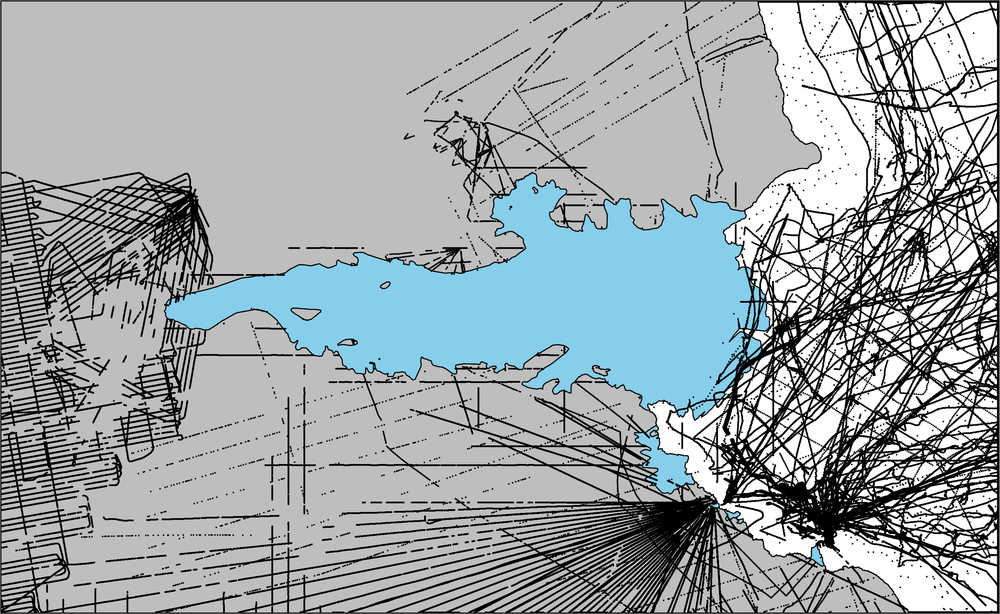

In [112]:
fig = maps.basemap(
    region=region,
    points=constraints,
    points_style="p1p",
    coast=True,
    simple_basemap=True,
)
fig.show()

In [115]:
# sample bedmap3 bed topography at the constraints
constraints = invert4geom.sample_grids(constraints, bed.upward, "upward")

## Get topography grids
Here we will load topography grids of ice surface, ice base, and bedrock, from Bedmap3.

In [5]:
ice_surface = fetch.bedmap3(
    layer="surface",
    reference="ellipsoid", 
    region=region,
    spacing=spacing,
    fill_nans=True,
)

water_surface = fetch.bedmap3(
    layer="icebase",
    reference="ellipsoid", 
    region=region,
    spacing=spacing,
    fill_nans=True,
)

bed = fetch.bedmap3(
    layer="bed",
    reference="ellipsoid", 
    region=region,
    spacing=spacing,
)

In [6]:
# rename coordinates and make into datasets
ice_surface = ice_surface.to_dataset(name="upward").rename(
    {"x":"easting", "y":"northing"}
)
water_surface = water_surface.to_dataset(name="upward").rename(
    {"x":"easting", "y":"northing"}
)
bed = bed.to_dataset(name="upward").rename(
    {"x":"easting", "y":"northing"}
)

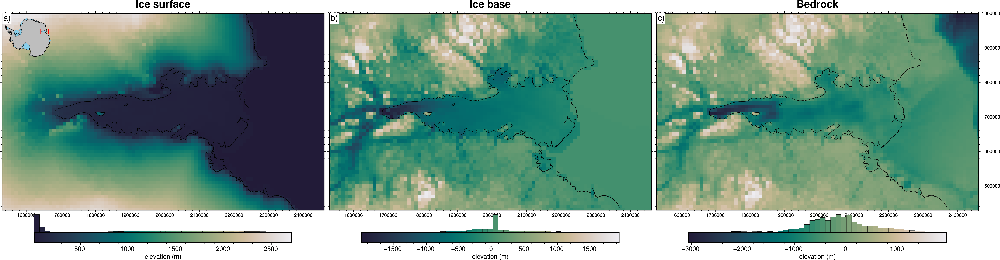

In [7]:
fig = maps.subplots(
    [ice_surface.upward, water_surface.upward, bed.upward],
    titles=["Ice surface", "Ice base", "Bedrock"],
    reverse_cpt=True,
    cmap="rain",
    cbar_label="elevation (m)",
    hist=True,
    frame=["nSwE", "xaf20000", "yaf20000"],
    coast=True,
    insets=[True, False, False],
)

fig.show()

## Correct for ice and water surface gravity effects

To forward model the gravity effect of some topography surface (e.g. rock topography, Moho, bathymetry), **Invert4Geom** uses a density contrast approach to discretization, as opposed to a absolute density approach. This approach uses a single layer of prisms, with density values of the density contrast between the medium's above and below the surface. As an example, to model bathymetry, the model elements (prisms or tesseroids) can be assigned a density of +600 kg/m3 (3300 kg/m3 - 2700 kg/m3) for elements above a reference level, and -600 kg/m3 for elements below the reference level. 

With this approach, any corrections for terrain or topography gravity effects should use this convention as well. In the example of a sub-ice shelf bathymetry model, prior to the inversion the gravity disturbance, or free-air anomaly data should be corrected for the gravity effects of the density contrast across the ice surface, and the ice base / water surface. Using the setup from the below figures, calculating and correcting for the gravity effects of ice and water surface (e and f) means that during the inversion, their gravity effects do not need to be recalculated at each iteration. Instead, if an absolute density approach was used, at each iteration the gravity effect of the water layer and the ice layer would need ot be recalculated as the bathymetry models changes. 
 

![uncertainty_workflow](../figures/topography_correction.png)

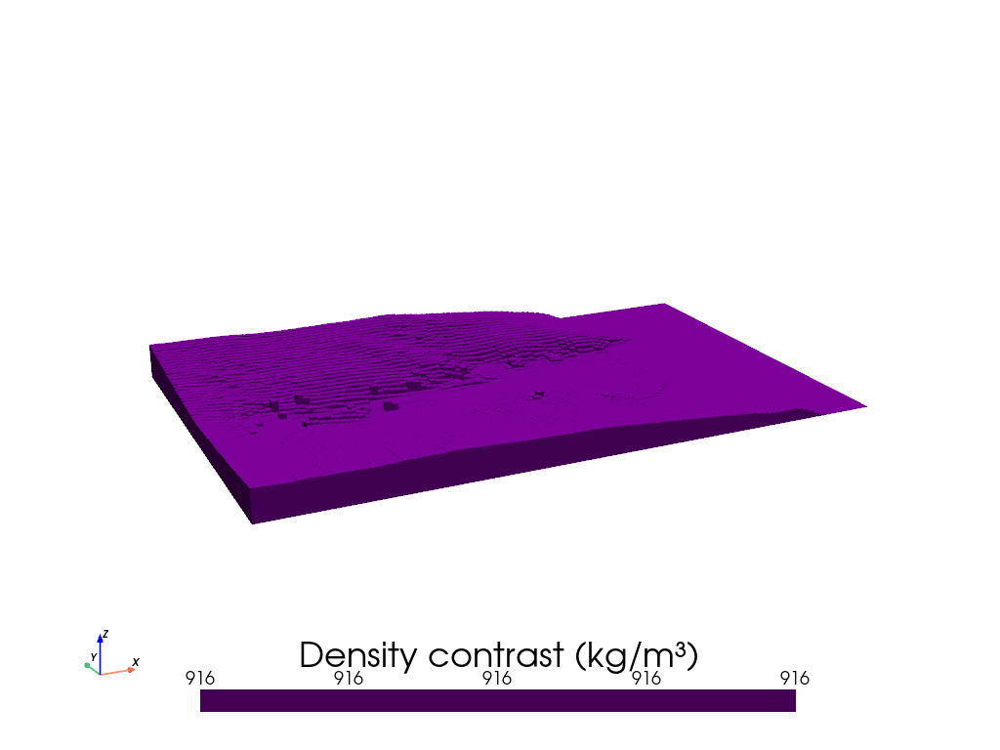

In [8]:
# create model object
ice_surface_model = invert4geom.create_model(
    zref=0,
    density_contrast=917 - 1, # ice - air in kg/m3
    starting_topography=ice_surface,
)
ice_surface_model.inv.plot_model(
    color_by="density",
    zscale=20,
)

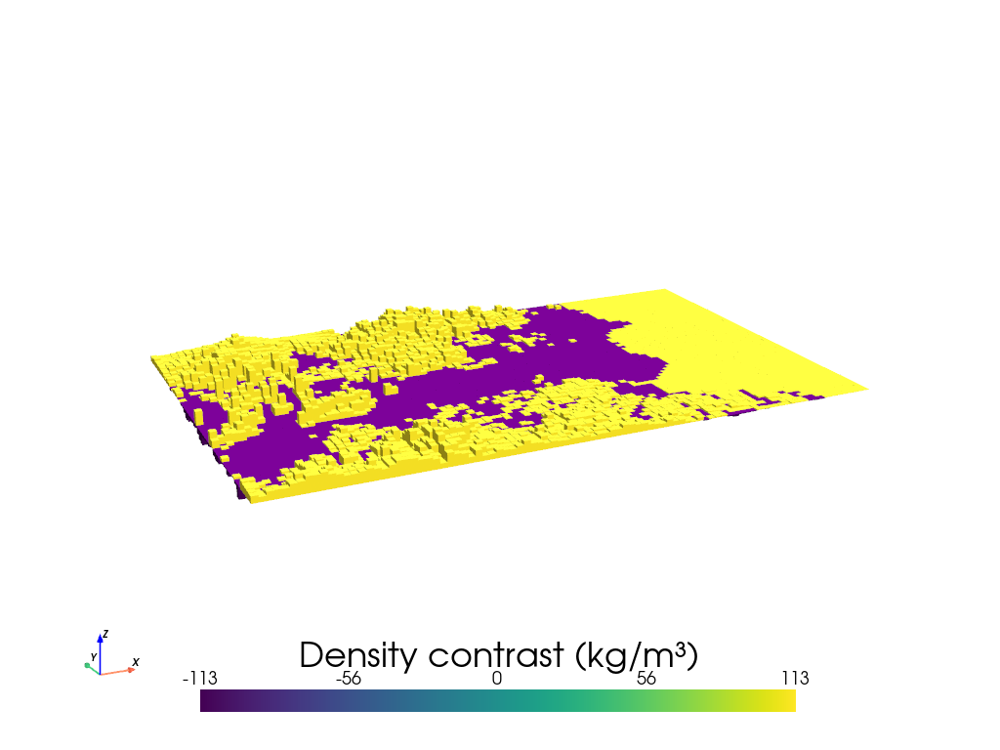

In [9]:
# create model object
water_surface_model = invert4geom.create_model(
    zref=0,
    density_contrast=1030 - 917, # water - ice in kg/m3
    starting_topography=water_surface,
)
water_surface_model.inv.plot_model(
    color_by="density",
    zscale=20,
)

In [10]:
# calculate gravity effect of models
grav_data.inv.forward_gravity(ice_surface_model, name="ice_surface")
grav_data.inv.forward_gravity(water_surface_model, name="water_surface")

grav_data

<xarray.Dataset> Size: 132kB
Dimensions:              (northing: 58, easting: 94)
Coordinates:
  * northing             (northing) float64 464B 4.3e+05 4.4e+05 ... 1e+06
  * easting              (easting) float64 752B 1.53e+06 1.54e+06 ... 2.46e+06
Data variables:
    gravity_disturbance  (northing, easting) float32 22kB 16.15 15.82 ... -16.24
    upward               (northing, easting) float32 22kB 2.428e+03 ... 24.28
    ice_surface          (northing, easting) float64 44kB 81.35 84.5 ... 0.9098
    water_surface        (northing, easting) float64 44kB 1.791 1.501 ... 0.1133
Attributes:
    region:        (1530000.0, 2460000.0, 430000.0, 1000000.0)
    spacing:       10000.0
    buffer_width:  60000.0
    inner_region:  (1590000.0, 2400000.0, 490000.0, 940000.0)
    dataset_type:  data
    model_type:    prisms

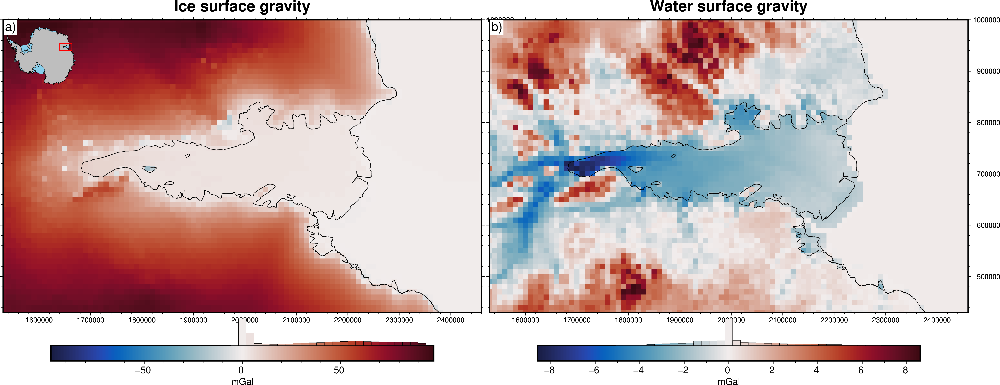

In [11]:
fig = maps.subplots(
    [grav_data.ice_surface, grav_data.water_surface],
    titles=["Ice surface gravity", "Water surface gravity"],
    cmap="balance+h0",
    cbar_label="mGal",
    hist=True,
    frame=["nSwE", "xaf20000", "yaf20000"],
    coast=True,
    insets=[True, False],
    absolute=True,
)

fig.show()

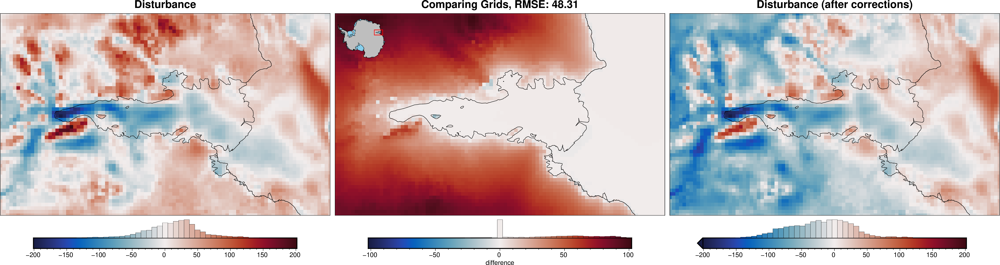

In [21]:
grav_data['gravity_anomaly'] = grav_data.gravity_disturbance - grav_data.ice_surface - grav_data.water_surface

_ = polar_utils.grd_compare(
    grav_data.gravity_disturbance, 
    grav_data.gravity_anomaly,
    cmap="balance+h0",
    hist=True,
    absolute=True,
    coast=True,
    grid1_name="Disturbance",
    grid2_name="Disturbance (after corrections)",
)
# fig = maps.plot_grd(
#     grav_data.gravity_anomaly,
#     title="Gravity disturbance (after corrections)",
#     cmap="balance+h0",
#     cbar_label="mGal",
#     hist=True,
#     frame=["nSwE", "xaf20000", "yaf20000"],
#     coast=True,
#     inset=True,
# )

# fig.show()


## Gravity misfit

All inversions in Invert4Geom are based on a gravity misfit, not a gravity anomaly. This means before the inversion, we must create a starting prism model, forward model it's gravity effect, remove it from the gravity anomaly, and get a gravity misfit. 

However, if we know nothing about the starting model, it can simply be a flat layer of zero thickness, as we will use here. In this case, the forward gravity would just be zero so there is no need to perform the forward modelling. The misfit is therefore just equal to the topo-free disturbance.

### Create starting model

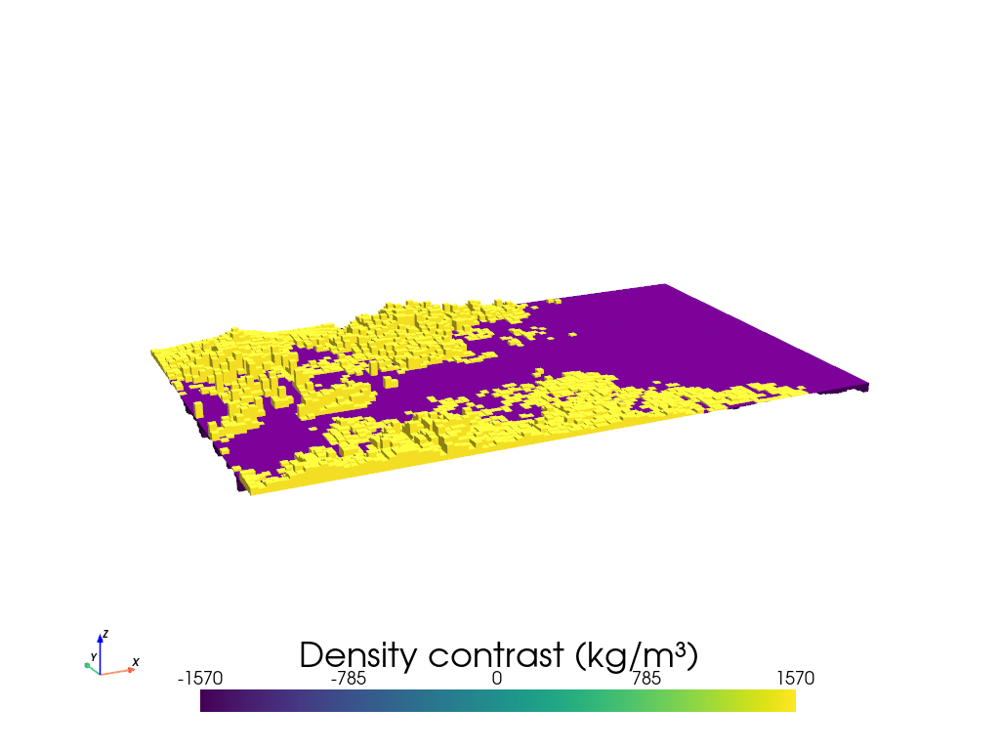

In [57]:
model = invert4geom.create_model(
    zref=0,
    density_contrast=2600 - 1030,
    starting_topography=bed,
    upper_confining_layer=water_surface.upward,
)
model.inv.plot_model(
    color_by="density",
    zscale=20,
)

### Forward gravity of starting prism layer

In [58]:
# calculate forward gravity of starting prism layer
grav_data.inv.forward_gravity(model)
grav_data

<xarray.Dataset> Size: 525kB
Dimensions:                   (northing: 58, easting: 94)
Coordinates:
  * northing                  (northing) float64 464B 4.3e+05 4.4e+05 ... 1e+06
  * easting                   (easting) float64 752B 1.53e+06 ... 2.46e+06
Data variables: (12/13)
    gravity_disturbance       (northing, easting) float32 22kB 16.15 ... -16.24
    upward                    (northing, easting) float32 22kB 2.428e+03 ... ...
    ice_surface               (northing, easting) float64 44kB 81.35 ... 0.9098
    water_surface             (northing, easting) float64 44kB 1.791 ... 0.1133
    gravity_anomaly           (northing, easting) float64 44kB -66.98 ... -17.26
    forward_gravity           (northing, easting) float64 44kB 24.61 ... -155.5
    ...                        ...
    reg                       (northing, easting) float64 44kB -85.21 ... 135.2
    res                       (northing, easting) float64 44kB -6.387 ... 3.097
    starting_forward_gravity  (northing, easting) float64 44kB 24.61 ... -155.5
    starting_misfit           (northing, easting) float64 44kB -91.59 ... 138.3
    starting_reg              (northing, easting) float64 44kB -85.21 ... 135.2
    starting_res              (northing, easting) float64 44kB -6.387 ... 3.097
Attributes:
    region:        (1530000.0, 2460000.0, 430000.0, 1000000.0)
    spacing:       10000.0
    buffer_width:  60000.0
    inner_region:  (1590000.0, 2400000.0, 490000.0, 940000.0)
    dataset_type:  data
    model_type:    prisms

### Regional estimation - constraint point minimization

In [123]:
# use the constraints to find the best regional field
regional_grav_kwargs = dict(
    method="constraints",
    constraints_df=constraints,
    
    grid_method="pygmt",
    tension_factor=.3,
    
    # grid_method="eq_sources",
    # # constraints_weights_column="weight",
    # # cv=True,
    # # cv_kwargs=dict(
    # #     n_trials=50,
    # #     damping_limits=(1e-60, 10),
    # #     depth_limits=(100, 1000e3),
    # #     progressbar=True,
    # #     fname="../tmp/ice_shelf_model_regional_sep",
    # # ),
    # damping=None,
    # depth="default",
    # block_size=50e3,
    
    # method="filter",
    # filter_width=200e3,
)

grav_data.inv.regional_separation(
    **regional_grav_kwargs,
)

grav_data.inv.df.describe()

,northing,easting,gravity_disturbance,upward,ice_surface,water_surface,gravity_anomaly,forward_gravity,misfit,reg,res,starting_forward_gravity,starting_misfit,starting_reg,starting_res
count,5452.000000,5.452000e+03,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000,5452.000000
mean,715000.000000,1.995000e+06,12.849148,942.347046,35.111642,0.260890,-22.523384,-10.030325,-12.493059,-9.743718,-2.749341,-10.030325,-12.493059,-9.743718,-2.749341
std,167422.045318,2.713642e+05,43.140285,835.828186,31.581171,2.291042,47.389566,45.400848,64.915010,63.912418,13.347956,45.400848,64.915010,63.912418,13.347956
min,430000.000000,1.530000e+06,-200.218567,16.353533,-22.191796,-8.424204,-200.820309,-181.466988,-176.802366,-171.517548,-91.522034,-181.466988,-176.802366,-171.517548,-91.522034
25%,570000.000000,1.760000e+06,-11.112311,58.818470,1.287033,-0.919114,-56.728268,-34.574408,-61.720829,-59.892877,-3.092565,-34.574408,-61.720829,-59.892877,-3.092565
50%,715000.000000,1.995000e+06,15.297336,937.852875,35.058855,0.089818,-19.833631,-9.632586,-13.007707,-12.547656,-0.101907,-9.632586,-13.007707,-12.547656,-0.101907
75%,860000.000000,2.230000e+06,36.761542,1659.856384,62.863484,1.039379,11.054393,14.228208,35.355597,39.317464,0.940319,14.228208,35.355597,39.317464,0.940319
max,1000000.000000,2.460000e+06,201.637970,2711.687012,97.609477,8.604379,145.488407,119.481506,178.120807,177.549271,63.685459,119.481506,178.120807,177.549271,63.685459


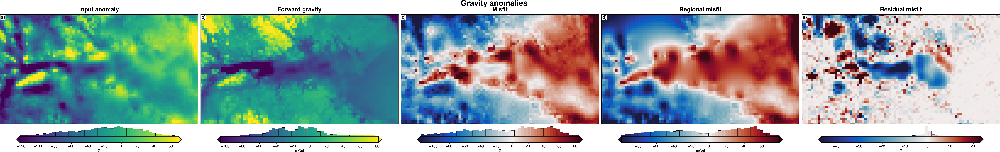

In [124]:
grav_data.inv.plot_anomalies()

## Single inversion
Perform a single inversion to experiment with values of stopping criteria.

In [125]:
# setup the inversion
inv = invert4geom.Inversion(
    grav_data,
    model,
    solver_damping=0.05,
    # set stopping criteria
    max_iterations=30,
    l2_norm_tolerance=0.5,
    delta_l2_norm_tolerance=1.01,
)

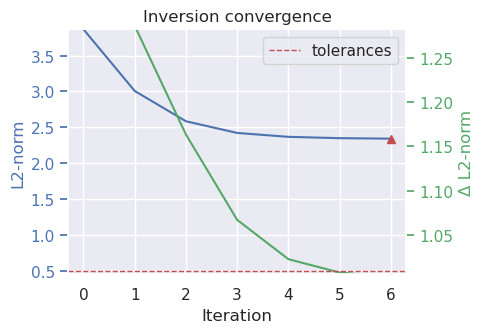

In [126]:
# run the inversion
inv.invert(
    plot_dynamic_convergence=True,
    results_fname="../tmp/ice_shelf_model",
)

In [127]:
inv.stats_df

,iteration,rmse,l2_norm,delta_l2_norm,iter_time_sec
0,0.0,14.955858,3.867280,inf,NaN
1,1.0,9.043595,3.007257,1.285983,4.974178
2,2.0,6.680700,2.584705,1.163482,5.146601
3,3.0,5.864752,2.421725,1.067299,5.165890
4,4.0,5.604233,2.367326,1.022979,4.974236
5,5.0,5.516666,2.348758,1.007905,5.014003
6,6.0,5.485375,2.342088,1.002848,5.401011


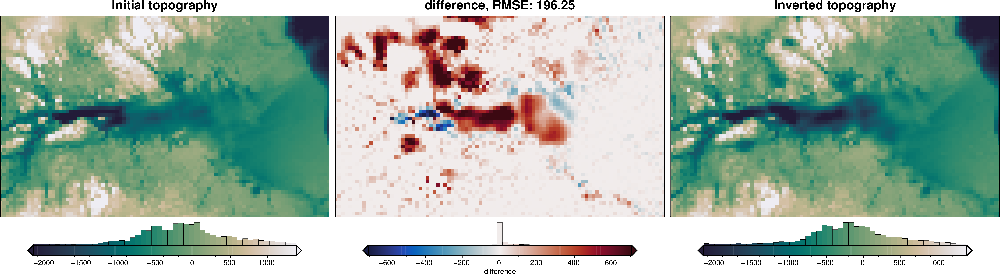

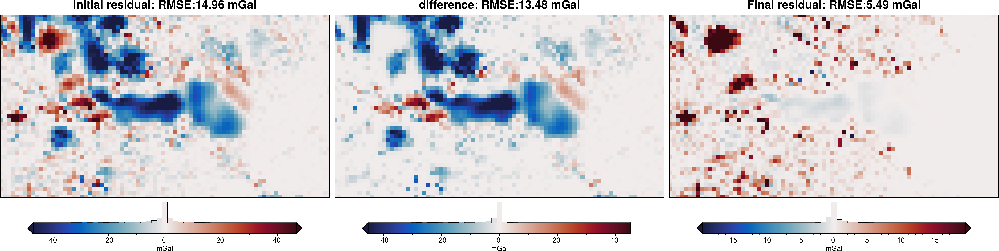

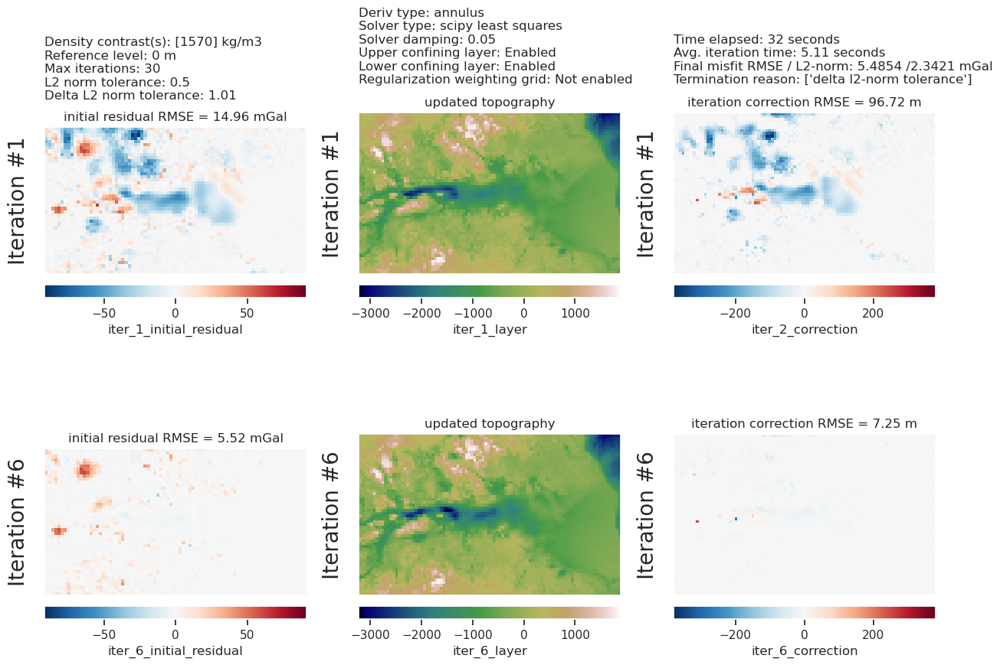

In [128]:
inv.plot_inversion_results(
    iters_to_plot=2,
)

In [131]:
antgg_bed = xr.load_dataarray(
    '/home/mdtanker/Downloads/doi_10_5061_dryad_rbnzs7hkc__v20240719/BED_ANTGG2022.tif',
    engine="rasterio",
).squeeze().drop_vars(["band", "spatial_ref"]).rename(
    {"x":"easting", "y":"northing"}
).rename("upward")
antgg_bed = fetch.resample_grid(antgg_bed, region=region)

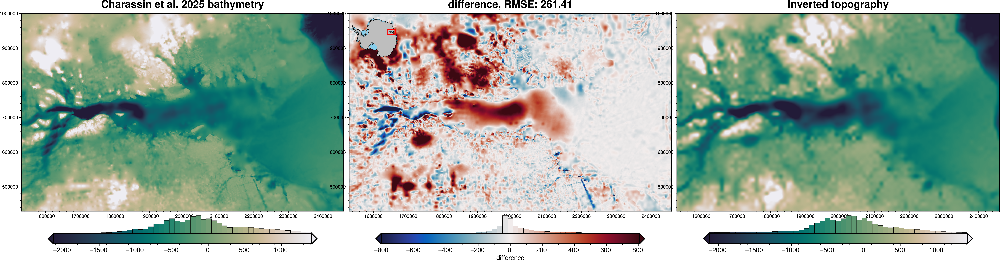

In [133]:
_ = polar_utils.grd_compare(
    antgg_bed,
    inv.model.topography,
    grid1_name="Charassin et al. 2025 bathymetry",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    title="difference",
    grounding_line=True,
    reverse_cpt=True,
    cmap="rain",
    frame=True,
    # points=constraints,
    # points_style="x.3c",
)

## Damping parameter cross validation

In [71]:
# resample data at 1/2 spacing to include test points for cross-validation
inv.data = invert4geom.add_test_points(inv.data)

ValueError: gravity dataframe already contains a 'test' column, not resampling. If you'd like to remove the test points, use `remove_test_points().

In [72]:
inv.reinitialize_inversion()

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Inversion terminated due to max_iterations limit. Consider increasing this limit.


0.06271412100983031

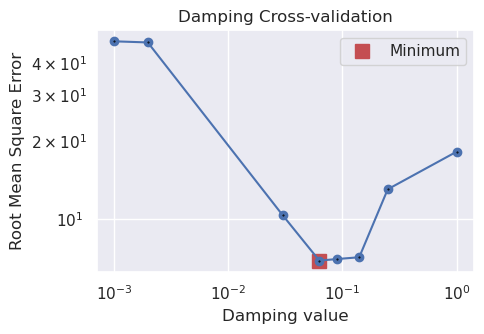

In [73]:
damping_cv_obj = inv.optimize_inversion_damping(
    damping_limits=(0.001, 1),
    n_trials=8,
    fname="../tmp/ice_shelf_model_damping_cv",
)
inv.solver_damping

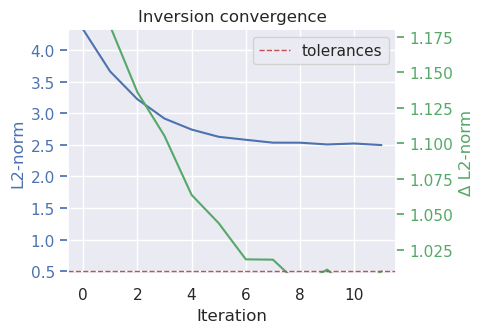

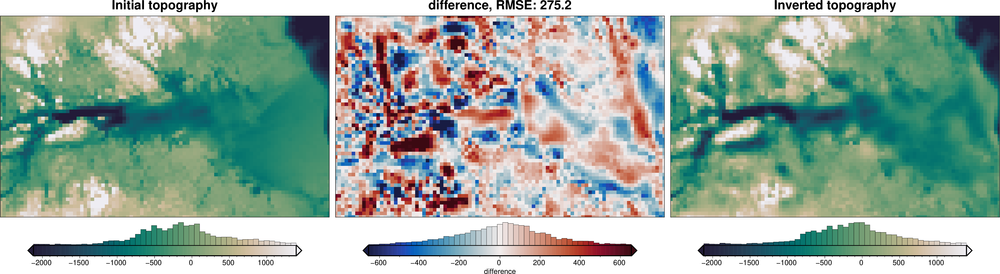

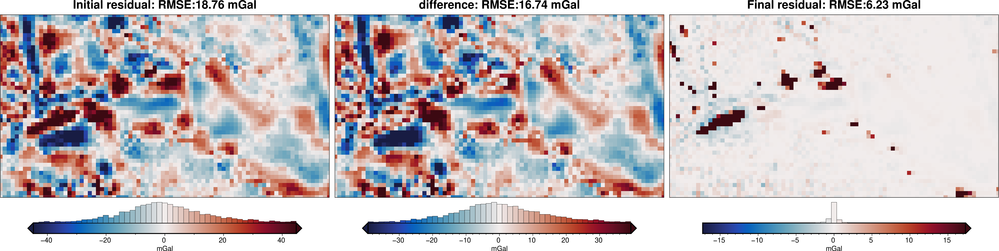

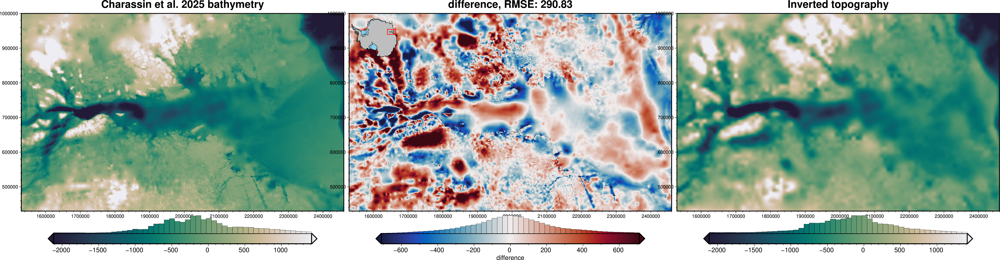

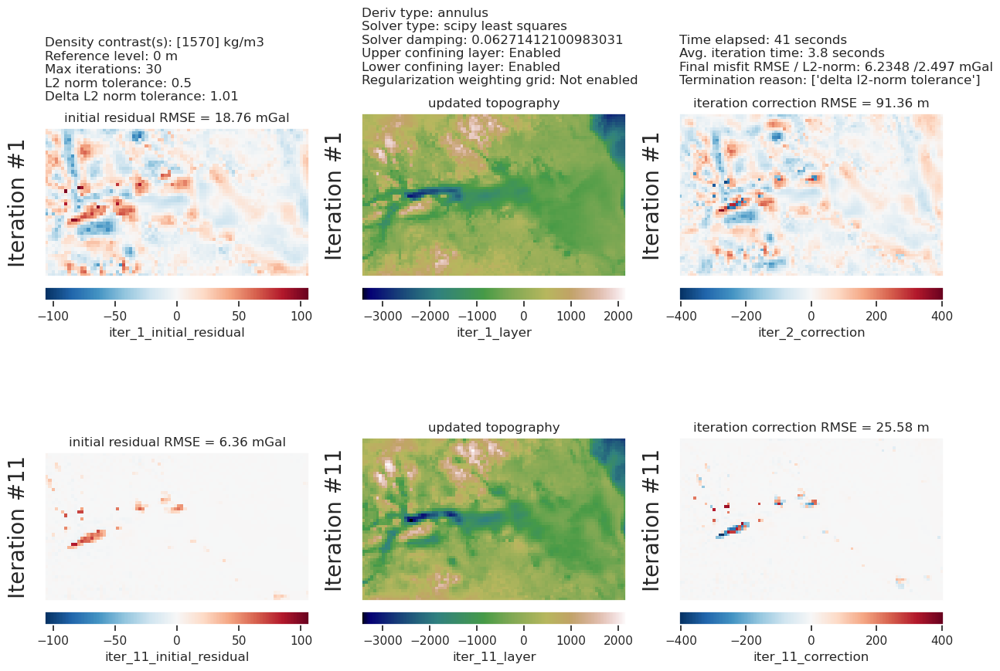

In [74]:
inv.plot_convergence()

inv.plot_inversion_results(iters_to_plot=2)

_ = polar_utils.grd_compare(
    antgg_bed,
    inv.model.topography,
    grid1_name="Charassin et al. 2025 bathymetry",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    title="difference",
    grounding_line=True,
    reverse_cpt=True,
    cmap="rain",
    frame=True,
)

## Density contrast / zref optimization
Since this optimization uses the inversion error at constraint points, we can't use the constraint point minimization technique to estimate the regional field since that inherently sets the inversion error at constraints to zero, invalidating the optimization scores. 

There are two options for how to get around this issue:
1) use a different regional estimation technique while finding the optimal density contrast and zref values, then use the found optimal values with the constraint point minimization regional estimation technique afterwards. 
2) separate the constraints into testing and training sets, so that only the training set is used during the regional separation, and only the testing set is used for scoring the density contrast and zref optimization. 

Well just use the 1st option below.

### Density optimization

In [75]:
# we don't need the testing points anymore
inv.data = invert4geom.remove_test_points(inv.data)

In [76]:
inv.reinitialize_inversion()

In [ ]:
# run the optimization for the density contrast
density_optimization_obj = inv.optimize_inversion_zref_density_contrast(
    constraints_df=constraint_points,
    density_contrast_limits=(100, 600),
    n_trials=10,
    regional_grav_kwargs=regional_grav_kwargs,
    starting_topography=bed,
    plot_scores=True,
    fname="../tmp/ice_shelf_model_density_optimization",
)

TypeError: Inversion.optimize_inversion_zref_density_contrast() missing 1 required positional argument: 'constraints_df'

In [ ]:
# The optimal value has been save as the Model's density contrast for future inversions
print(inv.model.density_contrast)

## Redo regional separation and inversion with optimal values

In [ ]:
# recreate model with optimal zref and density contrast
model = invert4geom.create_model(
    zref=inv.model.zref,
    density_contrast=inv.model.density_contrast,
    topography=starting_topography,
)

# calculate forward gravity of starting prism layer
grav_data.inv.forward_gravity(model)

# calculate regional gravity
grav_data.inv.regional_separation(
    **regional_grav_kwargs,
)

grav_data.inv.plot_anomalies()

In [ ]:
# setup the inversion
optimal_inv = invert4geom.Inversion(
    grav_data,
    model,
    solver_damping=inv.solver_damping,
    # set stopping criteria
    l2_norm_tolerance=0.5,
    delta_l2_norm_tolerance=1.008,
)
optimal_inv.solver_damping, optimal_inv.model.zref, optimal_inv.model.density_contrast

In [ ]:
# run the inversion
optimal_inv.invert(
    plot_dynamic_convergence=True,
    results_fname="../tmp/bishop_model_optimal",
)

In [ ]:
_ = polar_utils.grd_compare(
    grid.basement_topo,
    optimal_inv.model.topography,
    region=inversion_region,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points,
    points_style="x.3c",
)

In [ ]:
# sample the inverted topography at the constraint points
constraint_points = profiles.sample_grids(
    constraint_points,
    optimal_inv.model.topography,
    "inverted_topography",
)

rmse = polar_utils.rmse(
    constraint_points.true_upward - constraint_points.inverted_topography
)
print(f"RMSE: {rmse:.2f} m")

## Absolute value of inversion error

In [ ]:
inversion_error = np.abs(grid.basement_topo - optimal_inv.model.topography)
fig = maps.plot_grd(
    inversion_error,
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points,
    points_style="x.4c",
    # points_pen="1p",
    points_fill="white",
)
fig.show()

In [ ]:
# plotting functions for uncertainty results
def uncert_plots(
    results,
    inversion_region,
    spacing,
    true_topography,
    constraints_df=None,
    weight_by=None,
):
    if (weight_by == "constraints") & (constraints_df is None):
        msg = "must provide constraints_df if weighting by constraints"
        raise ValueError(msg)

    stats_ds = invert4geom.merged_stats(
        results=results,
        plot=True,
        constraints_df=constraints_df,
        weight_by=weight_by,
        region=inversion_region,
    )

    try:
        mean = stats_ds.weighted_mean
        stdev = stats_ds.weighted_stdev
    except AttributeError:
        mean = stats_ds.z_mean
        stdev = stats_ds.z_stdev

    _ = polar_utils.grd_compare(
        true_topography,
        mean,
        region=vd.pad_region(inversion_region, -spacing),
        grid1_name="True topography",
        grid2_name="Inverted topography",
        robust=True,
        hist=True,
        inset=False,
        title="difference",
        grounding_line=False,
        reverse_cpt=True,
        cmap="rain",
        points=constraints_df,
        points_style="x.3c",
    )
    _ = polar_utils.grd_compare(
        np.abs(true_topography - mean),
        stdev,
        region=vd.pad_region(inversion_region, -spacing),
        grid1_name="True error",
        grid2_name="Stochastic uncertainty",
        cmap="thermal",
        robust=True,
        hist=True,
        inset=False,
        title="difference",
        grounding_line=False,
        points=constraints_df,
        points_style="x.3c",
        points_fill="white",
    )
    return stats_ds

## Uncertainty analysis


In [ ]:
# get mean spacing between nearest constraints
mean_constraint_spacing = np.mean(
    vd.median_distance(
        (constraint_points.easting, constraint_points.northing),
        k_nearest=1,
    )
)
mean_constraint_spacing

In [ ]:
# use optimal eq source parameters for regional separation in uncertainty analysis
# re-load the study from the saved pickle file
with pathlib.Path(f"{regional_grav_kwargs.get('cv_kwargs').get('fname')}.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)
reg_eq_damping = min(study.best_trials, key=lambda t: t.values[0]).params["damping"]
reg_eq_depth = min(study.best_trials, key=lambda t: t.values[0]).params["depth"]

new_regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    damping=reg_eq_damping,
    depth=reg_eq_depth,
    block_size=None,
)

reg_eq_damping, reg_eq_depth

### Damping component

In [ ]:
# load study
with pathlib.Path("../tmp/bishop_model_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
# stdev = 0.4
print(f"using stdev: {stdev}")

In [ ]:
fig = invert4geom.plot_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

In [ ]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(optimal_inv.solver_damping),  # mean base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}

fname = "../tmp/bishop_model_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

stats_ds = uncert_plots(
    uncert_damping_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

### Density component

In [ ]:
# load study
with pathlib.Path("../tmp/bishop_model_density_optimization_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

density_stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {density_stdev}")

# manually pick a stdev
# density_stdev = 20
print(f"using stdev: {density_stdev}")

In [ ]:
fig = invert4geom.plot_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + density_stdev
lower = best - density_stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", density_stdev, "\n+1std:", upper, "\n-1std:", lower)

In [ ]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": optimal_inv.model.density_contrast,
        "scale": density_stdev,
    },
}

fname = "../tmp/bishop_model_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

uncert_plots(
    uncert_density_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

### Zref component

In [ ]:
# load study
with pathlib.Path("../tmp/bishop_model_zref_optimization_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

zref_stdev = study_df2.params_zref.std()
print(f"calculated stdev: {zref_stdev}")

# manually pick a stdev
# zref_stdev = 20
print(f"using stdev: {zref_stdev}")

In [ ]:
fig = invert4geom.plot_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_zref.values,
    param_name="Reference level",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_zref.iloc[0]
upper = best + zref_stdev
lower = best - zref_stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", zref_stdev, "\n+1std:", upper, "\n-1std:", lower)

In [ ]:
zref_dict = {
    "zref": {
        "distribution": "normal",
        "loc": optimal_inv.model.zref,
        "scale": zref_stdev,
    },
}

fname = "../tmp/bishop_model_uncertainty_zref"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_zref_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=10,
    parameter_dict=zref_dict,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

uncert_plots(
    uncert_zref_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

### Constraints component

In [ ]:
fname = "../tmp/bishop_model_uncertainty_constraints"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_constraints_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=10,
    sample_constraints=True,
    constraints_df=constraint_points,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

uncert_plots(
    uncert_constraints_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

### Gravity component

In [ ]:
fname = "../tmp/bishop_model_uncertainty_grav"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_grav_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=10,
    sample_gravity=True,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

uncert_plots(
    uncert_grav_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

### Regional field estimation uncertainty

We will do the same thing for the regional estimation procedure. First we will re-separate the regional to see what equivalent source gridding parameter values were determined optimal. We then estimate an uncertainty distribution for these parameter values, and create an ensemble of regional models which each randomly sample both the parameter values and the gravity data. 

In [ ]:
mean_constraint_spacing, reg_eq_depth, reg_eq_damping

In [ ]:
np.abs(np.log10(reg_eq_damping))

In [ ]:
regional_misfit_parameter_dict = {
    "depth": {
        "distribution": "uniform",
        "loc": 2 * mean_constraint_spacing,  # lower bound
        "scale": 5 * mean_constraint_spacing,  # range, 2+5=7
    },
    # "depth": {
    #     "distribution": "normal",
    #     "loc": reg_eq_depth,  # mean base 10 exponent
    #     "scale": reg_eq_depth / 5,  # standard deviation of exponent
    # },
    "damping": {
        "distribution": "uniform",
        "loc": np.log10(reg_eq_damping),
        "scale": np.abs(np.log10(reg_eq_damping)),
        # "scale": 2,
        "log": True,
    },
}

regional_misfit_stats, _ = invert4geom.regional_misfit_uncertainty(
    runs=100,
    parameter_dict=regional_misfit_parameter_dict,
    grav_ds=optimal_inv.data,
    region=optimal_inv.data.inner_region,
    **new_regional_grav_kwargs,
)

In [ ]:
# update grav dataset
optimal_inv.data["reg_uncert"] = regional_misfit_stats.z_stdev

### Regional gravity component

In [ ]:
fname = "../tmp/bishop_model_uncertainty_regional"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_regional_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=10,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

uncert_plots(
    uncert_regional_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

### Total Uncertainty

In [ ]:
fname = "../tmp/bishop_model_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = invert4geom.full_workflow_uncertainty_loop(
    optimal_inv,
    fname=fname,
    runs=20,
    sample_gravity=True,
    sample_constraints=True,
    constraints_df=constraint_points,
    parameter_dict=density_dict | zref_dict | solver_dict,
    regional_grav_kwargs=new_regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
)

uncert_plots(
    uncert_results,
    optimal_inv.data.inner_region,
    optimal_inv.data.spacing,
    grid.basement_topo,
    constraints_df=constraint_points,
    weight_by="constraints",
)

## Comparing results

In [ ]:
results = [
    uncert_results,
    uncert_regional_results,
    uncert_grav_results,
    uncert_constraints_results,
    uncert_density_results,
    uncert_zref_results,
    uncert_damping_results,
]
names = [
    "full",
    "regional",
    "grav",
    "constraints",
    "density",
    "zref",
    "damping",
]
# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = invert4geom.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=optimal_inv.data.inner_region,
    )
    stats.append(ds)

In [ ]:
# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs, compat="override")
merged

In [ ]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncertainty from regional estimation",
    "Uncertainty from gravity",
    "Uncertainty from constraints",
    "Uncertainty from density",
    "Uncertainty from reference level",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

# grids.insert(0, np.abs(stats[0].weighted_mean - grid.basement_topo))
grids.insert(0, inversion_error)

grids = [
    g.sel(
        easting=slice(
            optimal_inv.data.inner_region[0], optimal_inv.data.inner_region[1]
        ),
        northing=slice(
            optimal_inv.data.inner_region[2], optimal_inv.data.inner_region[3]
        ),
    )
    for g in grids
]
cpt_lims = polar_utils.get_min_max(
    grids[0],
    robust=True,
)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
        # cpt_lims = polar_utils.get_min_max(
        #     g,
        #     robust=True,
        # )
    elif i == 4:
        origin_shift = "both"
        xshift_amount = -3
    else:
        origin_shift = "x"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        title=titles[i],
        title_font="16p,Helvetica,black",
        # cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.25,
        points=constraint_points,
        points_style="x.2c",
        points_pen="1.5p",
        points_fill="white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profile location, and endpoints on map
        start = [optimal_inv.data.inner_region[1], optimal_inv.data.inner_region[3]]
        stop = [optimal_inv.data.inner_region[0], optimal_inv.data.inner_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

In [ ]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
        "orange",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[optimal_inv.data.inner_region[1], optimal_inv.data.inner_region[3]],
    stop=[optimal_inv.data.inner_region[0], optimal_inv.data.inner_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()